# Oxygen Budget Analysis 

This notebook analyzes the O$_2$ budget from POP output. Dissolved oxygen in the ocean's interior is simulated following:

$$
\frac{\partial{O_2}}{\partial{t}}= \underbrace{- \frac{\partial{U.O_2}}{\partial{x}} -\frac{\partial{V.O_2}}{\partial{y}}}_\text{Lateral Advection}
- \overbrace{\frac{\partial{W.O_2}}{\partial{z}}}^\text{Vertical Advection}
+ \underbrace{A_h.\nabla^2{O_2}}_\text{Lateral Mixing}
+\overbrace{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}^\text{Vertical Mixing}
+ \underbrace{ J(O_2)  }_\text{Sources - Sinks}
$$



In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.simplefilter("ignore") # Silence warnings

import xarray as xr
import numpy as np
from tqdm import tqdm
import xgcm 
import pop_tools

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmocean
import cartopy
import cartopy.crs as ccrs
import proplot 
import matplotlib.patches as patches

from utils import *

In [18]:
C=CLSTR(1,15,200,10)

In [19]:
C

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/37364/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/37364/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.46:45598,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/37364/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [4]:
dsh=xr.open_mfdataset({'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/O2_Budget_Mean.nc',
                      '/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/O2_Budget_Eddy_Mean.nc',})

du=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/CLM/[UVW]VEL.CLM.nc')
dshm=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/[UVW]_dO2m_Mean.nc')
dshd=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/[UVW]_dO2_Mean.nc')
dshe=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/DIVde_Mean.nc')

# dshm=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/DIVd_Mean.nc')
# dshd=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/DIVdm_Mean.nc')
# dshe=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/DIVde_Mean.nc')


### Plot 

In [5]:
def plot_depth_section(ax,x,z, var,cntf,lev,clr,units,title,coords,fs,fsx,lw,alp,cb_on,profile):
    if cntf==True: 
        cs= ax.contourf(x,z,var,levels=lev,cmap=clr,extend='both')
        if cb_on==True:
            cb = plt.colorbar(cs, ax=ax, orientation='vertical', extend='both',pad=0.02)#, aspect=20)  
#             cb.ax.set_title(units,fontsize=fs-1,pad=0.2)
            cb.set_label(units, rotation=0,size=fs-2,position=(0,1.08))
            cb.ax.tick_params(labelsize=fs-1)
            cb.ax.minorticks_off()
    if cntf==False: cs= ax.contour(x,z,var,colors=clr,linewidths=lw,levels=lev,alpha=alp)
    ax.set_title(title,loc='center',fontsize=fs)
    ax.set_ylim(coords[0]); ax.set_xlim(coords[1]); ax.minorticks_on(); 
    ax.set_ylabel('Depth (m)',fontsize=fs-2); 
    ax.set_aspect('auto')
    if profile=='lon': ax.set_xlabel('Latitude ($^{o}$N)',fontsize=fs-2)
    if profile=='lat': ax.set_xlabel('Longitude ($^{o}$E)',fontsize=fs-2)
    ax.set_title(title,pad=0.01,fontsize=fs, loc='center');
    ax.tick_params(axis='both', labelsize=fs)  
    return ax 

def plot_cmap(ax,lon,lat, var,vmn, vmx, stp, clr,units,title,coor,fs,fsx,lon_lab,lat_lab):
    ax.set_extent(coor,crs=cartopy.crs.PlateCarree())
    pc= ax.contourf(lon,lat,var,np.arange(vmn,vmx,stp),cmap=clr,transform=ccrs.PlateCarree(), extend='both') #, 
    land = ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',linewidth=0.1, edgecolor='black', facecolor='grey'))
    cb = plt.colorbar(pc, ax=ax, orientation='vertical', extend='both',pad=0.02)#, aspect=20)  
    cb.set_label(units, rotation=0,size=fs-3,position=(0.0,1.08))
#     cb.ax.set_title(units,fontsize=fs-1,pad=0.2)
    cb.ax.minorticks_off()
    cb.ax.tick_params(labelsize=fs)
    ax.set_aspect('auto')
    ax.set_title(title,loc='center',fontsize=fs)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
    return ax


### Integrate over depth, meridional, zonal bands

In [6]:
top=50; bot=150
Si=2  ; Ni=6 
Ei=-100 ; Wi=-160


clr_o2='NegPos'
om_clr='blue'
omz_clr='green'
odz_clr='lime'


N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)

100%|██████████| 6/6 [02:44<00:00, 27.42s/it]


<bound method Figure.tight_layout of <Figure size 1600x1400 with 12 Axes>>

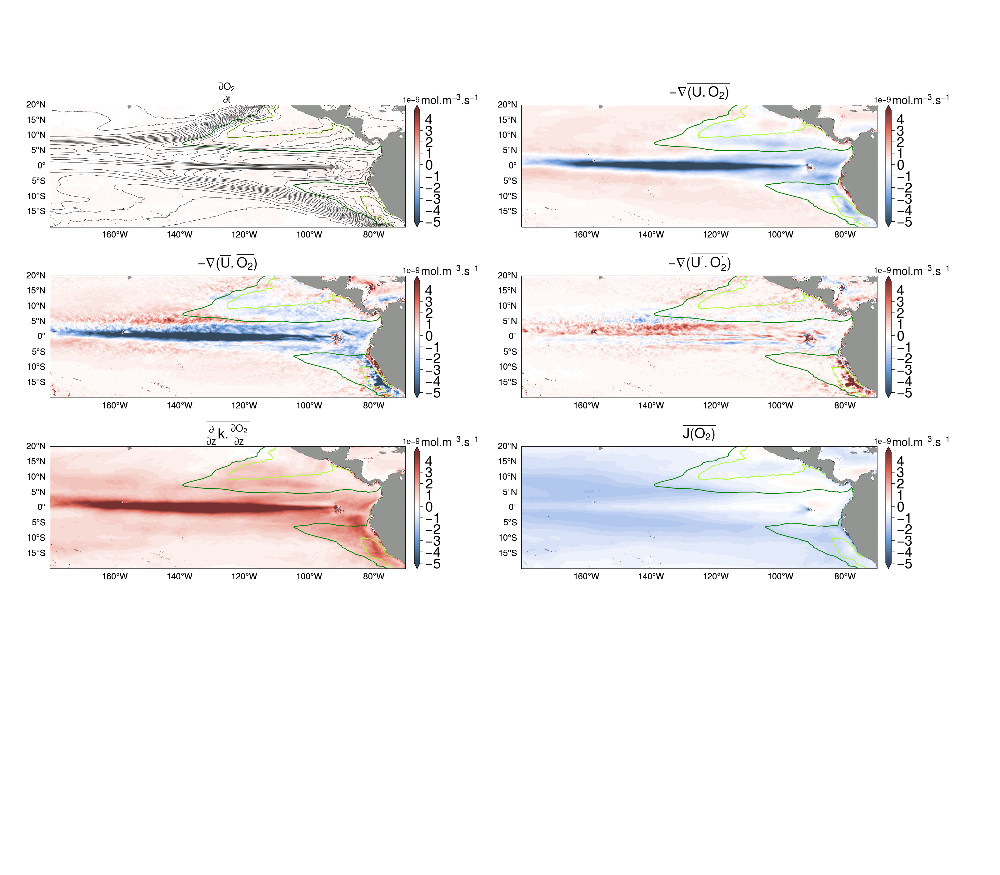

In [23]:
fig = plt.figure(figsize=(16,14),dpi=100)
fs=16; fsx=10
EE=-200.0; WW=-70.1; SS=-20.0; NN=20.1
coor=[EE,WW,SS,NN]; CL=215.0 # central longtiude 
lon_lab=np.concatenate([np.arange(EE,WW,20)])
lat_lab=np.arange(SS,NN,5)

clr_o2='NegPos'
om_clr='blue'
omz_clr='green'
odz_clr='lime'

VAR= [dsh.TEND_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.DIV.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.DIVm.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.DIVp.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
#       dsh.UE_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3)+dsh.VN_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
#       dsh.WT_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.VDIF.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.J_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),]

units=['   mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
#      r'$-\nabla_H{\overline{(U.O_2)}}$ ',
#      r'$\overline{\frac{\partial{w.O_2}}{\partial{z}}}$ ',
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']



clrs=[clr_o2]
lmax=5e-9
lmin=-lmax
lstp=lmax*0.5e-1


gs = fig.add_gridspec(nrows=3, ncols=2, bottom=0.35,left=0.05, right=0.95, wspace=0.1, hspace=0.4)
rng=[0,1,2,3,4,5]
r=[0,0,1,1,2,2]
c=[0,1,0,1,0,1]

for i in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[r[i], c[i]] ,projection=ccrs.PlateCarree())
    ax = plot_cmap(ax,dsh.TLONG,dsh.TLAT, VAR[i],lmin, lmax, lstp,
                   clrs[0],units[0],title[i],coor,fs,fsx, lon_lab,lat_lab)
#     (dv.UVEL).isel(z_t=15).plot.contour(colors='black',linewidths=0.7,levels=np.arange(-150,150,50))
    ax.contour(dsh.TLONG,dsh.TLAT, dsh.O2.isel(z_t=15),colors=omz_clr,linewidths=0.9,levels=np.arange(60,60.1,5))    
    ax.contour(dsh.TLONG,dsh.TLAT, dsh.O2.isel(z_t=15),colors=odz_clr,linewidths=0.9,levels=np.arange(20,20.1,5)) 
    if i==0: 
        ax.contour(dsh.TLONG,dsh.TLAT, dsh.O2.isel(z_t=15),colors='black',linewidths=0.3,levels=np.arange(0,200.1,10)) 
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
fig.tight_layout

In [24]:
savefig(fig,"Final_Figures/O2_budget_map_HR")

In [ ]:
# path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/PD.mon.nc'
# dsp = xr.open_mfdataset(path, decode_times=False, decode_coords=False).mean('time')
# dsp


# dsp.to_netcdf('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/PD.clim.nc')

100%|██████████| 6/6 [00:08<00:00,  1.44s/it]


<bound method Figure.tight_layout of <Figure size 2500x700 with 12 Axes>>

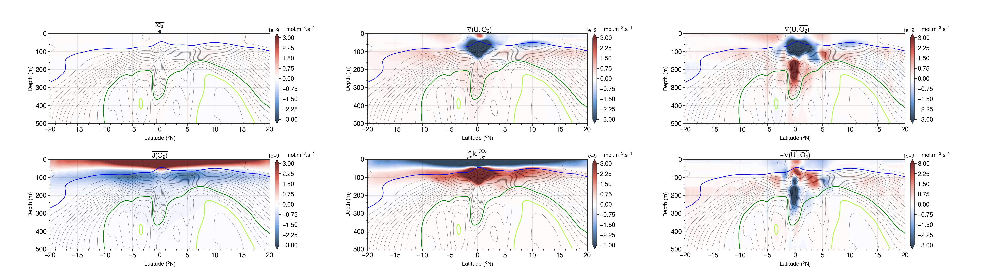

In [77]:
fig = plt.figure(figsize=(25,7),dpi=100,)
gs = fig.add_gridspec(nrows=2, ncols=3, left=0.05, right=0.95, wspace=0.2, hspace=0.4)

fs=12; fsx=5; 
SS=-20; NN=20
tops=0. ; bots=500.; 
coords=[[bots,tops],[SS,NN]]

om_clr='blue'

var= [dsh.TEND_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIVm.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIVp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.VDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.J_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),]

cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']

clr=[clr_o2]
lw=0.5; alp=1;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsh.TLAT[:,E]
z= dsh.z_t*1e-2

i=[0,0,0,1,1,1]; j=[0,1,2,2,1,0]
for k in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))
    
    
#     cs2= cax.contour(y, z,(dsp.PD.isel(nlon=slice(W,E)).mean('nlon').squeeze()-1)*1e3, colors='orange', linewidths=1.0, levels=np.arange(20,27,0.5))
#     ax2.clabel(cs2,np.arange(20,27,0.5), fontsize=10)


fig.tight_layout

In [78]:
savefig(fig,"Final_Figures/O2_budget_Meridional_HR")

100%|██████████| 9/9 [00:13<00:00,  1.49s/it]


<bound method Figure.tight_layout of <Figure size 2500x1100 with 18 Axes>>

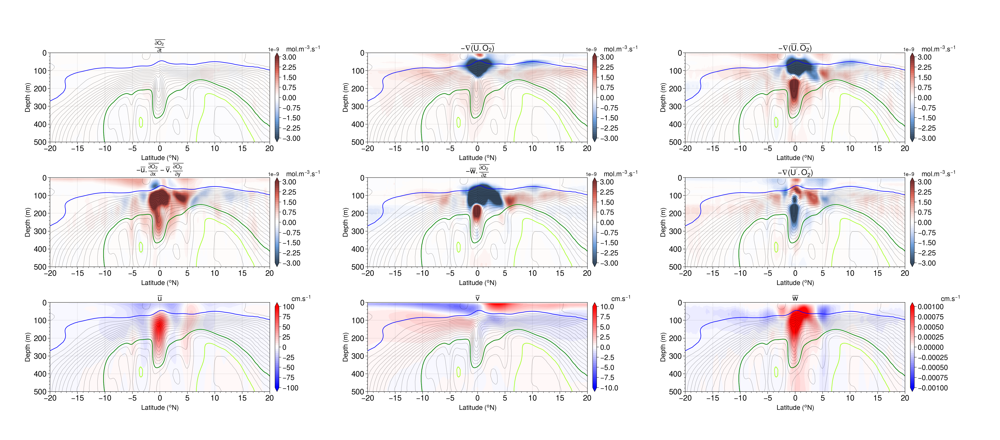

In [79]:
fig = plt.figure(figsize=(25,11),dpi=100,)
gs = fig.add_gridspec(nrows=3, ncols=3, left=0.05, right=0.95, wspace=0.2, hspace=0.4)

fs=14; fsx=6; 
SS=-20; NN=20
tops=0. ; bots=500.; 
coords=[[bots,tops],[SS,NN]]

om_clr='blue'


var= [dsh.TEND_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIVm.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIVp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dshd.W_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dshd.U_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dshd.V_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      du.UVEL.isel(nlon=slice(W,E)).mean('nlon'),
      du.VVEL.isel(nlon=slice(W,E)).mean('nlon'),
      du.WVEL.isel(nlon=slice(W,E)).mean('nlon')]

cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
     r"$-\overline{w}.\overline{\frac{\partial{O_2}}{\partial{z}}}$",
     r'$-\overline{u}.\overline{\frac{\partial{O_2}}{\partial{x}}} - \overline{v}.\overline{\frac{\partial{O_2}}{\partial{y}}}$ ',
    r'$\overline{u}$',
      r'$\overline{v}$',
      r'$\overline{w}$',]

#       dshm.U_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dshm.V_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dshm.W_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dshm.DIVd.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dshd.DIVd.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dshd.U_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dshd.V_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dshd.W_dO2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dshe.DIVdp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),

clr=[clr_o2]
lw=0.5; alp=1;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsh.TLAT[:,E]
z= dsh.z_t*1e-2

i=[0,0,0,1,1,1,2,2,2]; j=[0,1,2,2,1,0,0,1,2]
for k in tqdm(np.arange(0,9)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
#     if k>3: lo = -3e-8; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
    if k>5: clr=['bwr']; units=['cm.s$^{-1}$']
    if k>5: lo = -1e2; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
    if k>6: lo = -1e1; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
    if k>7: lo = -1e-3; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
    
    cax= plot_depth_section(ax,y,z,var[k].squeeze(),cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))
#     cs2= cax.contour(y, z,(dsp.PD.isel(nlon=slice(W,E)).mean('nlon').squeeze()-1)*1e3, colors='orange', linewidths=1.0, levels=np.arange(20,27,0.5))
#     ax2.clabel(cs2,np.arange(20,27,0.5), fontsize=10)


fig.tight_layout

In [80]:
savefig(fig,"Final_Figures/O2_budget_Meridional_HR_full")

100%|██████████| 6/6 [00:06<00:00,  1.06s/it]


<bound method Figure.tight_layout of <Figure size 2000x700 with 12 Axes>>

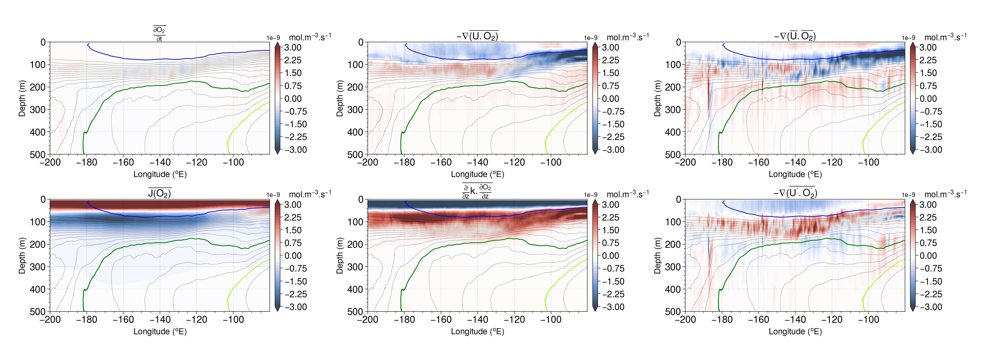

In [76]:
fig = plt.figure(figsize=(20,7),dpi=100,)
gs = fig.add_gridspec(nrows=2, ncols=3, left=0.05, right=0.95, wspace=0.2, hspace=0.4)

fs=14; fsx=5; 
SS=-15; NN=15
EE=-200.0; WW=-80.1;
tops=0. ; bots=500.; 
coords=[[bots,tops],[EE,WW]]


var= [dsh.TEND_O2.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.DIV.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.DIVm.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.DIVp.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.VDIF.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.J_O2.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),]

cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']
clr=[clr_o2]
lw=0.5; alp=0.5;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsh.TLONG[N,:]-360
z= dsh.z_t*1e-2

i=[0,0,0,1,1,1]; j=[0,1,2,2,1,0]
for k in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lat')
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))

fig.tight_layout

In [72]:
savefig(fig,"Final_Figures/O2_budget_Zonal_HR")

In [101]:
# N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
# S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# # volume integral
dshb=dsh.isel(nlon=slice(W,E)).sum('nlon').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t').compute()
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3)
dshb

<xarray.Dataset>
Dimensions:      (nlat: 631, z_w: 41, z_w_top: 41)
Coordinates:
  * z_w          (z_w) float32 0.0 1e+03 2e+03 ... 8.296e+04 9.28e+04 1.041e+05
  * z_w_top      (z_w_top) float32 0.0 1e+03 2e+03 ... 9.28e+04 1.041e+05
Dimensions without coordinates: nlat
Data variables: (12/33)
    DIV          (nlat) float64 -1.176e+15 -4.461e+10 ... 1.136e+12 1.169e+12
    DIVm         (nlat) float64 -9.014e+14 1.81e+11 ... 8.781e+11 5.937e+11
    HDIF         (nlat) float64 7.874e+10 -1e+10 ... -8.625e+09 -5.44e+10
    J_O2         (nlat) float64 -2.798e+12 -2.804e+12 ... -2.547e+12 -2.559e+12
    O2           (nlat) float32 1.397e+06 1.395e+06 ... 1.046e+06 1.046e+06
    STF_O2       (nlat) float64 -1.346e+11 -1.269e+11 ... -1.61e+12 -1.618e+12
    ...           ...
    dzw          (z_w) float32 500.0 1e+03 1e+03 ... 1.059e+04 1.215e+04
    VOL          (nlat) float64 5.566e+18 5.576e+18 ... 3.853e+18 3.841e+18
    Up_O2p       (nlat) float64 1.667e+12 -3.144e+10 ... -1.124e+10 6.961e+09
    Vp_O2p       (nlat) float64 -1.06e+14 1.772e+11 ... 2.614e+11 5.151e+11
    Wp_O2p       (nlat) float64 -3.681e+11 -3.713e+11 ... 1.982e+10 1.403e+10
    DIVp         (nlat) float64 -1.046e+14 -2.256e+11 ... 2.579e+11 5.494e+11

(-1e-08, 2e-09)

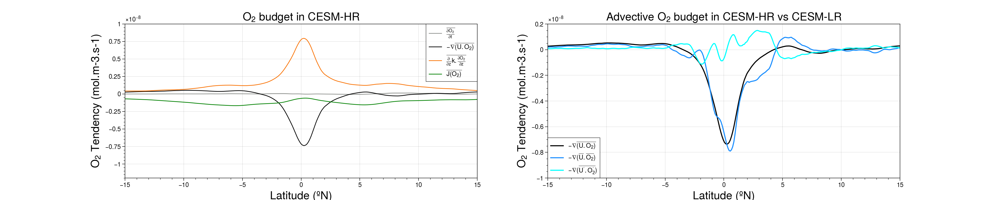

In [107]:
fig, ax = plt.subplots(1,2, figsize=(20,4), sharey=False)

VARS=[dshb.TEND_O2,
      dshb.DIV,
#       dshb.DIVm,
#       dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
#      r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
#      r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','orange','green'] #'dodgerblue','cyan',

i=0
for VAR in VARS:
    ax[0].plot(dsh.TLAT[:,0],VAR * nmol_mol/VOL_hr,
               label=str(title[i]), color=clr[i],lw=1)
    i+=1
ax[0].legend()
ax[0].set_title('O$_2$ budget in CESM-HR',size=16)# integrated over '+str(abs(Wi))+'W-'+str(abs(Ei))+'W '+str(top)+'-'+str(bot)+'m')
ax[0].set_ylabel('O$_2$ Tendency (mol.m-3.s-1)',fontsize=16)
ax[0].set_xlabel('Latitude (ºN)',fontsize=16)
ax[0].set_xlim(-15,15)
ax[0].set_ylim(-1.2e-8,1.0e-8)


# Plot Advective budget terms for both resolutions     
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']

i=1
for VAR in VARS[1:4]:
    ax[1].plot(dsh.TLAT[:,0],VAR * nmol_mol/VOL_hr,
               label=str(title[i]), color=clr[i],lw=1.5)
    i+=1
ax[1].legend()
ax[1].set_title('Advective O$_2$ budget in CESM-HR vs CESM-LR',size=16)# integrated over '+str(abs(Wi))+'W-'+str(abs(Ei))+'W '+str(top)+'-'+str(bot)+'m',size=20)
ax[1].set_ylabel('O$_2$ Tendency (mol.m-3.s-1)',fontsize=16)
ax[1].set_xlabel('Latitude (ºN)',fontsize=16)
ax[1].set_xlim(-15,15)
ax[1].set_ylim(-1.0e-8,0.20e-8)


In [87]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# volume integral
dshb=(dsh.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')).compute()
dshb
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3).compute()

Text(5.5, 500000.0, 'CESM-HR')

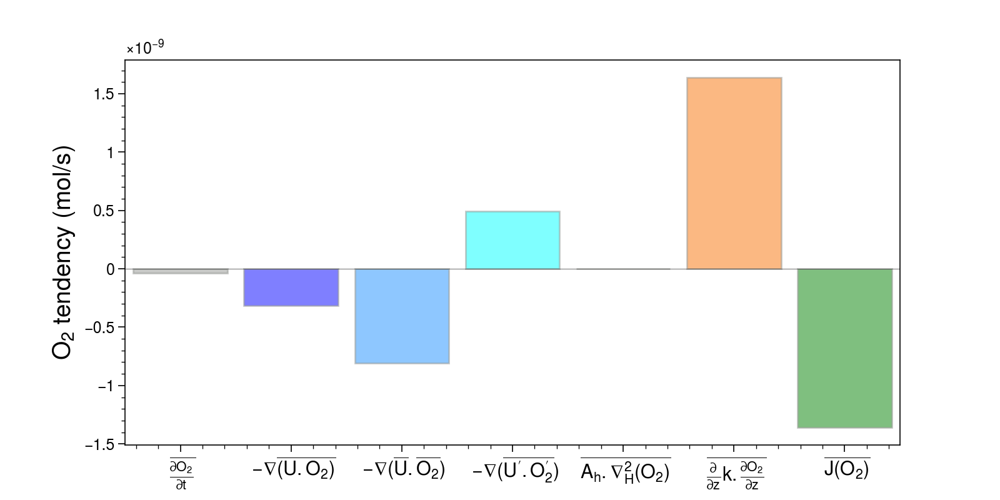

In [96]:
fig = plt.figure(figsize=(8,4),dpi=100,)
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.HDIF,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
      r' $\overline{A_h.\nabla_H^2{({O_2})}}$',
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]
clr=['grey','blue','dodgerblue','cyan','purple','orange','green']
x=np.arange(0,len(VARS))
plt.bar(x,[V * nmol_mol/VOL_hr for V in VARS],width=0.85,align='center',color=clr,alpha=0.5,lw=1.0,edgecolor='grey')

plt.xticks(x, title,size=11)
plt.hlines(0,-0.5,6.5,lw=0.2,color='k')
plt.grid(b=None)
plt.xlim(-0.5,6.5)
# plt.ylim(-6e5,6e5)
plt.ylabel(r"O$_2$ tendency (mol/s)",size=14)
plt.text(5.5,5.0e5,'CESM-HR',color="dodgerblue",size=18)

In [8]:
top=50; bot=150
Si=-2  ; Ni=2 
Ei=-100 ; Wi=-160
dq=dsh
N,W=find_indices(dq.TLONG,dq.TLAT,360+Wi,Ni)
S,E=find_indices(dq.TLONG,dq.TLAT,360+Ei,Si)

In [9]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# volume integral
dshb=(dsh.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')).compute()
dshb
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3).compute()

Text(5.5, 500000.0, 'CESM-HR')

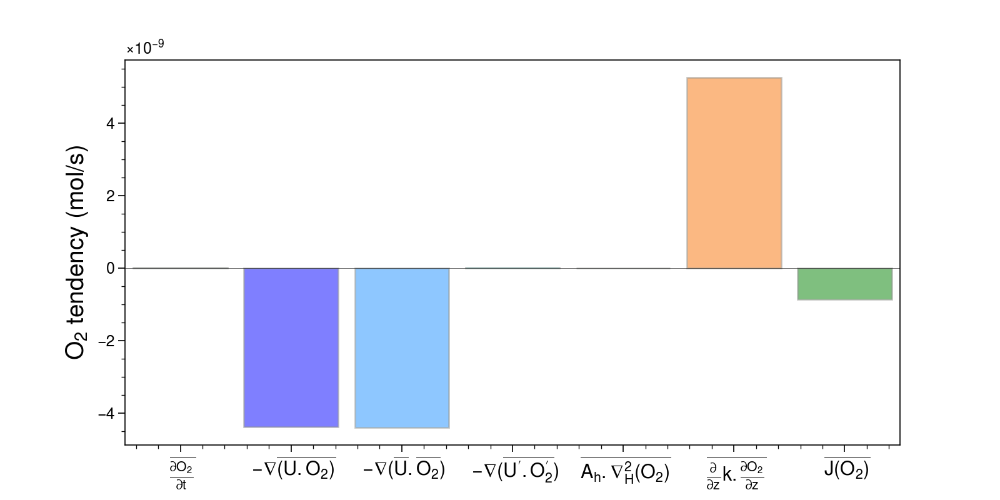

In [10]:
fig = plt.figure(figsize=(8,4),dpi=100,)
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.HDIF,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
      r' $\overline{A_h.\nabla_H^2{({O_2})}}$',
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]
clr=['grey','blue','dodgerblue','cyan','purple','orange','green']
x=np.arange(0,len(VARS))
plt.bar(x,[V * nmol_mol/VOL_hr for V in VARS],width=0.85,align='center',color=clr,alpha=0.5,lw=1.0,edgecolor='grey')

plt.xticks(x, title,size=11)
plt.hlines(0,-0.5,6.5,lw=0.2,color='k')
plt.grid(b=None)
plt.xlim(-0.5,6.5)
# plt.ylim(-6e5,6e5)
plt.ylabel(r"O$_2$ tendency (mol/s)",size=14)
plt.text(5.5,5.0e5,'CESM-HR',color="dodgerblue",size=18)

In [98]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# volume integral
dshb=(dsh.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat')).compute()
dshb
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat')*cm3_m3).compute()

(50000.0, 5000.0)

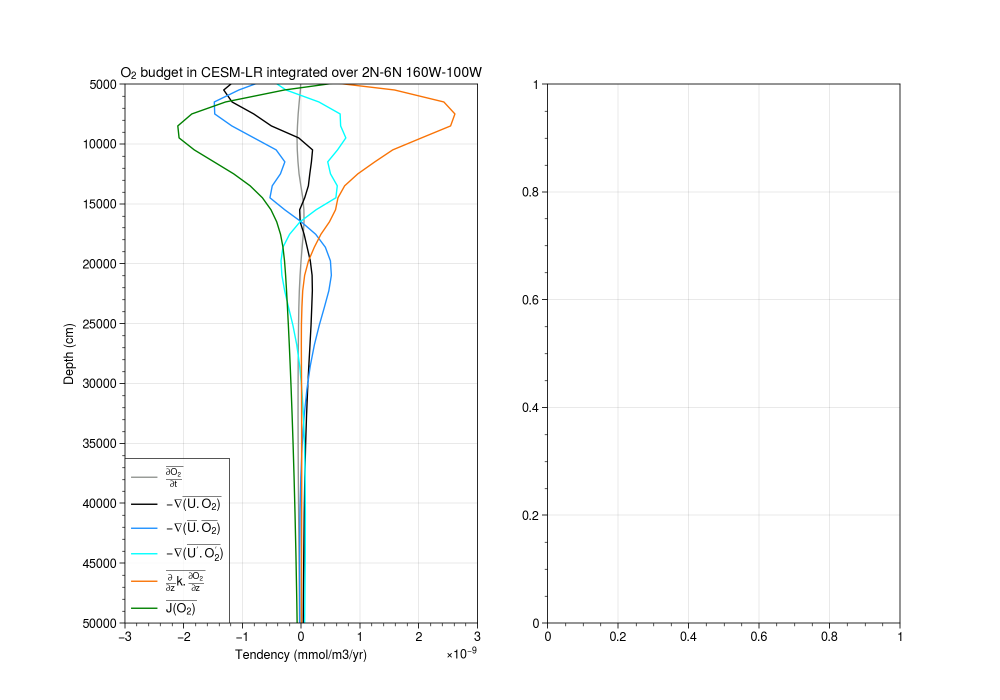

In [99]:
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,]
VARC=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']
dpt=500e2
conv_mmol_m3_mo=nmol_mol


i=0
fig, ax = plt.subplots(1,2, figsize=(10,7), sharey=False)
for VAR in VARS:
    (VAR*nmol_mol/VOL_hr).plot(y="z_t", ylim=(dpt, 0), label=str(VARC[i]), ax=ax[0],color=clr[i],lw=1)
    i+=1
ax[0].legend()
ax[0].set_title('O$_2$ budget in CESM-LR integrated over '+str(Si)+'N-'+str(Ni)+'N '+str(abs(Wi))+'W-'+str(abs(Ei))+'W ')
ax[0].set_ylabel('Depth (cm)')
ax[0].set_xlabel('Tendency (mmol/m3/yr)')
ax[0].set_xlim(-3e-9,3e-9)
ax[0].set_ylim(500e2,50e2)


------
------
------
------


### Calculate tendency from restart file

In [9]:
# Calculate longterm O2 tedency from initial and final time step form restart files
file = '/glade/scratch/yeddebba/Mesoscale/HR/restart/O2_0001-01-06-00000t.nc'
rs = xr.open_mfdataset(file)
file = '/glade/scratch/yeddebba/Mesoscale/HR/restart/O2_0006-01-01-00000t.nc'
rs2 = xr.open_mfdataset(file)

O2_tend=(rs2['O2_CUR']-rs['O2_CUR']).compute()
dt=(24*60*60*365*5)
ds['TEND_O2']=O2_tend/dt
ds['TEND_O2']=ds.TEND_O2.rename({'k': 'z_t','j': 'nlat','i': 'nlon'})
ds.TEND_O2.attrs=ds.O2.attrs
ds.TEND_O2.attrs['long_name']='O2 Tendency'
ds.TEND_O2.attrs['units']='mmol/m^3/s'
ds

OSError: no files to open


### Integrate over density range

In [ ]:
file = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/O2.mon.nc' #use climatology if monthly means not available >>> O2.mon.clm.nc
dsm = xr.open_mfdataset(file)
file = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/PD.mon.nc'  #use climatology if monthly means not available >>> PD.mon.clm.nc
dsmp = xr.open_mfdataset(file)

U_ISO=[1.0235]; L_ISO=[1.0260]; Si=2; Ni=8; Wi=160; Ei=120 ;
lat1,lon1= find_indices(dg.TLONG,dg.TLAT,360-Wi,Si)
lat2,lon2= find_indices(dg.TLONG,dg.TLAT,360-Ei,Ni)
O2=dsm.O2.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2)).where(
    (dsmp.PD.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2))<=L_ISO[0])&(dsmp.PD.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2))>=U_ISO[0]))
volb=vol.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2))
iO2m=(O2*mmol_Tmol*volb).sum(['nlat','nlon','z_t']).compute()

iO2mx=iO2m.groupby('time.month').max(dim='time').compute()
iO2mn=iO2m.groupby('time.month').min(dim='time').compute()
iO2mean=iO2m.groupby('time.month').mean(dim='time').compute()

U_ISO=[1.0245]; L_ISO=[1.0260]; Si=2; Ni=8; Wi=160; Ei=120 ;
lat1,lon1= find_indices(dsh.TLONG,dsh.TLAT,360-Wi,Si)
lat2,lon2= find_indices(dsh.TLONG,dsh.TLAT,360-Ei,Ni)

VAR=dsh.DIV.isel(nlon=1000).where((dsp.PD.isel(nlon=1000)<=L_ISO[0])&(dsp.PD.isel(nlon=1000)>=U_ISO[0]))#*nmol_mol/(dsh.VOL.where((dsp.PD<=L_ISO[0])&(dsp.PD>=U_ISO[0]))*cm3_m3)
VAR

In [36]:
O2=dsm.O2.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2)).where(
    (dsmp.PD.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2))<=L_ISO[0])&(dsmp.PD.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2))>=U_ISO[0]))
volb=vol.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2))
iO2m=(O2*mmol_Tmol*volb).sum(['nlat','nlon','z_t']).compute()

VAR[0]

<xarray.DataArray (nlat: 631, nlon: 1701)>
dask.array<truediv, shape=(631, 1701), dtype=float64, chunksize=(631, 1701), chunktype=numpy.ndarray>
Coordinates:
    TLAT     (nlat, nlon) float64 -29.99 -29.99 -29.99 ... 30.03 30.03 30.03
    TLONG    (nlat, nlon) float64 120.1 120.2 120.2 120.3 ... 289.8 289.9 290.0
    ULONG    (nlat, nlon) float64 120.1 120.2 120.3 ... -70.11 -70.01 -69.91
    ULAT     (nlat, nlon) float64 -29.94 -29.94 -29.94 ... 30.07 30.07 30.07
    time     object 0003-07-05 00:00:00
Dimensions without coordinates: nlat, nlon

### Evaluate advection of gradient terms >>> Eddy Term

100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


<bound method Figure.tight_layout of <Figure size 2500x700 with 12 Axes>>

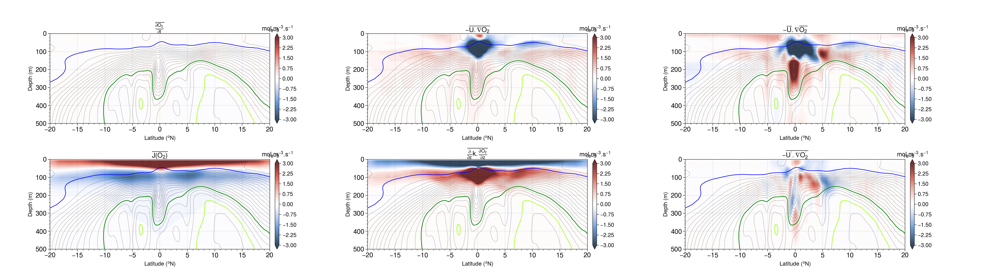

In [168]:
fig = plt.figure(figsize=(25,7),dpi=100,)
gs = fig.add_gridspec(nrows=2, ncols=3, left=0.05, right=0.95, wspace=0.2, hspace=0.4)

fs=12; fsx=5; 
SS=-20; NN=20
tops=0. ; bots=500.; 
coords=[[bots,tops],[SS,NN]]

# var= [dsh.TEND_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dsh.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dsh.DIVm.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dsh.DIVp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dsh.VDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
#       dsh.J_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),]

var= [dsh.TEND_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dshd.DIVd.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dshe.DIVdp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.VDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.J_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),]

cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
# title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
#      r'$-\nabla{\overline{(U.O_2)}}$ ',
#      r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
#      r"$-\nabla{(\overline{U'.O_2'})}$",
#      r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
#      r'$\overline{J(O_2)}$ ']

title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r"$-\overline{U.\nabla{O_2}}$",
     r'$-\overline{U}.\nabla{\overline{O_2}}$ ',
     r"$-\overline{U'.\nabla{O_2'}}$",
#      r'$-\nabla_H{\overline{(U.O_2)}}$ ',
#      r'$\overline{\frac{\partial{w.O_2}}{\partial{z}}}$ ',
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']

clr=[clr_o2]
lw=0.5; alp=1;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsh.TLAT[:,E]
z= dsh.z_t*1e-2

i=[0,0,0,1,1,1]; j=[0,1,2,2,1,0]
for k in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))
#     cs2= cax.contour(y, z,(dsp.PD.isel(nlon=slice(W,E)).mean('nlon').squeeze()-1)*1e3, colors='orange', linewidths=1.0, levels=np.arange(20,27,0.5))
#     ax2.clabel(cs2,np.arange(20,27,0.5), fontsize=10)


fig.tight_layout